In [1]:


# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
from ipywidgets import interact
# bokeh packages
from bokeh.io import output_file,show,output_notebook,push_notebook
from bokeh.plotting import *
from bokeh.models import ColumnDataSource,HoverTool,CategoricalColorMapper
from bokeh.layouts import row,column,gridplot,widgetbox

from bokeh.layouts import layout

from bokeh.embed import file_html

from bokeh.models import Text
from bokeh.models import Plot
from bokeh.models import Slider
from bokeh.models import Circle
from bokeh.models import Range1d
from bokeh.models import CustomJS
from bokeh.models import LinearAxis
from bokeh.models import SingleIntervalTicker

from bokeh.palettes import Spectral6
output_notebook()

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory



Loading BokehJS ...

['scmp2k19.csv']


In [2]:
import cufflinks as cf
cf.set_config_file(world_readable=True,offline=True)

In [3]:
# load data to pandas dataframe
df = pd.read_csv('../input/scmp2k19.csv')

In [4]:
# explore the top five rows
df.head()

,Aws ID,district,mandal,location,odate,cumm_rainfall,humidity_min,humidity_max
0,10001,Medchal-Malkajgiri,Uppal,Moulali,01/01/18,0.0,23.8,100.0
1,10001,Medchal-Malkajgiri,Uppal,Moulali,02/01/18,0.0,23.2,100.0
2,10001,Medchal-Malkajgiri,Uppal,Moulali,03/01/18,0.0,31.5,100.0
3,10001,Medchal-Malkajgiri,Uppal,Moulali,04/01/18,0.0,27.4,100.0
4,10001,Medchal-Malkajgiri,Uppal,Moulali,05/01/18,0.0,28.6,100.0


In [5]:
# get some info about data 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237273 entries, 0 to 237272
Data columns (total 8 columns):
Aws ID           237273 non-null int64
district         237273 non-null object
mandal           237273 non-null object
location         237273 non-null object
odate            237273 non-null object
cumm_rainfall    237273 non-null float64
humidity_min     237246 non-null float64
humidity_max     237243 non-null float64
dtypes: float64(3), int64(1), object(4)
memory usage: 14.5+ MB


In [6]:
# make a copy of our data
data = df.copy()

In [7]:
# explore columns related to the addrress
data.loc[:,['district','mandal','location',]].sample(8,random_state=1)

,district,mandal,location
43770,Rangareddy,Gandipet,Manikonda
125305,Warangal (U),Inole,Inole
32470,Khammam,Penuballi,Penuballi
146103,Mahabubnagar,Nawabpet,Kolloor
1784,Medchal-Malkajgiri,Kapra,Malkaram
76751,Warangal (R),Nallabelly,Nallabelly
124423,Nalgonda,Narketpalle,Nemmani
4072,Vikarabad,Kodangal,Kodangal


In [8]:
# drop unnecessary columns
column_to_drop = ['district','mandal' ,'location', 'odate']
data.drop(columns=column_to_drop, axis=1,inplace=True)

In [9]:
# check the columns now
data.columns

Index(['Aws ID', 'cumm_rainfall', 'humidity_min', 'humidity_max'], dtype='object')

In [10]:
# check for duplicate values
data.duplicated().sum()

2436

In [11]:
# drop the duplicates
data.drop_duplicates(inplace=True)

In [12]:
# check for null values
((data.isna().sum()/data.shape[0])*100).round(2)

Aws ID           0.00
cumm_rainfall    0.00
humidity_min     0.01
humidity_max     0.01
dtype: float64

In [13]:
# check for unique values in the humidity_min  column
data.humidity_min.unique()

array([23.8, 23.2, 31.5, 27.4, 28.6, 22. , 21.4, 26.5, 35.7, 34. , 30.7,
       21.1, 18.6, 25.9, 24. , 18. , 24.7, 21.6, 14.4, 14.3, 19. , 24.4,
       25.6, 28. , 17.8, 20.8, 25. , 26.2, 13.3, 10.2, 10.4, 12.7, 16.6,
       13.1, 15.3, 19.2, 37.5, 37. , 32.8, 32.1, 20.5, 23.4, 17.4, 16.8,
       11.7, 12.4, 10.5, 10.1,  9.9, 10.7,  9.5, 11.1,  8.7, 19.5, 12.9,
       13.4, 35. , 35.3, 34.3, 22.5, 18.2, 13.2, 11.4, 39.2, 18.7, 17. ,
       11.3, 14.9, 33.5, 47.1, 29.3, 30.9, 32.5, 27.6, 40. , 29. , 15.2,
        8.4,  7.2, 56.1, 25.4, 23.5, 15.1, 17.3, 19.6,  9.1, 23. , 15.8,
        8.3,  8.1,  6.2, 25.5, 33.1, 26. , 14.7, 16.5, 10.3, 26.8, 23.6,
       24.6, 31.2, 29.2, 24.9,  6.8, 20.4, 21.7, 31.6, 10.6, 33.3,  4.6,
       31.4, 22.6, 26.9, 20.9, 16.4, 30.1,  5.5, 55.5, 35.4, 28.9, 63.1,
       64.1, 58.7, 62. , 77.5, 59.6, 48. , 48.5, 32.7, 35.8, 42.4, 37.4,
       35.1, 47.5, 69.2, 62.7, 61.8, 57.4, 55.2, 61.3, 56.5, 40.4, 39.4,
       41.4, 54.3, 49.1, 52.1, 75.5, 88.9, 91.1, 90

In [14]:
def get_humidity_min(x):
    '''
    extract the humidity_min value out of a string inside tuple
    '''
    # ensure that x is not Null and there is more than one humidity_min
    if not x or len(x) <= 1:
        return None
    humidity_min = [float(i[0].replace('min','').strip())  for i in x if type(i[0])== str]
    return round((sum(humidity_min)/len(humidity_min)),1)

In [15]:
# if we check for each value type
type(data.humidity_max[0])

numpy.float64

In [16]:
import ast 
# get the before number of null values
data.humidity_min.isna().sum()

27

In [17]:
# check now
((data.isna().sum()/data.shape[0])*100).round(2)

Aws ID           0.00
cumm_rainfall    0.00
humidity_min     0.01
humidity_max     0.01
dtype: float64

In [18]:
# first let's drop the humidity_max column now
data.drop(columns='humidity_min',axis=1,inplace=True)
# test for data size
data.shape

(234837, 3)

In [19]:
# check for percentage of null values 
((data.isna().sum()/data.shape[0])*100).round(2)

Aws ID           0.00
cumm_rainfall    0.00
humidity_max     0.01
dtype: float64

In [20]:
import cufflinks as cf
cf.set_config_file(world_readable=True,offline=True)
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = 10,6
plt.xkcd() # let's have some funny plot
%matplotlib inline
import numpy as np # we will use this later, so import it now

from bokeh.io import output_notebook, show
from bokeh.plotting import figure

/opt/conda/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning:

findfont: Font family ['xkcd', 'xkcd Script', 'Humor Sans', 'Comic Sans MS'] not found. Falling back to DejaVu Sans.



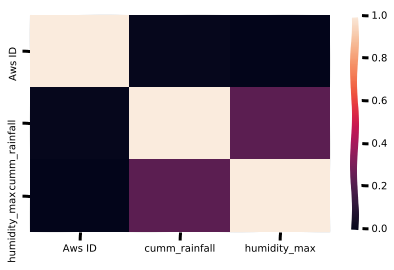

In [21]:
sns.heatmap(data.corr());

In [22]:
df.describe()

,Aws ID,cumm_rainfall,humidity_min,humidity_max
count,237273.000000,237273.000000,237246.000000,237243.000000
mean,11194.410595,2.459461,41.452513,81.199991
std,1259.596954,9.681493,21.008036,15.267132
min,10001.000000,0.000000,0.100000,4.000000
25%,10667.000000,0.000000,24.600000,71.100000
50%,11096.000000,0.000000,37.200000,83.200000
75%,11513.000000,0.000000,55.700000,94.900000
max,20014.000000,303.800000,99.900000,100.000000


In [23]:
df.columns

Index(['Aws ID', 'district', 'mandal', 'location', 'odate', 'cumm_rainfall',
       'humidity_min', 'humidity_max'],
      dtype='object')

In [24]:
df['district'].value_counts()

Nalgonda                    15400
Rangareddy                  13750
Mahabubnagar                11275
Nizamabad                   10725
Khammam                     10450
Siddipet                     9625
Medak                        9350
Suryapet                     9075
Sangareddy                   9075
Nagarkurnool                 9023
Vikarabad                    7975
Kamareddy                    7975
Jagtial                      7975
Jayashankar-Bhupalpally      7975
Yadadri-Bhongir              7425
Bhadradri-Kothagudem         7150
Nirmal                       7150
Karimnagar                   6875
Mancherial                   6325
Mahabubabad                  5775
Rajanna-Siricilla            5775
Warangal (R)                 5775
Jangaon                      5500
Medchal-Malkajgiri           5500
Jogulamba-Gadwal             5225
Adilabad                     5225
Peddapalli                   5225
Kumuram Bheem - Asifabad     4950
Hyderabad                    4675
Wanaparthy    

In [25]:
#sangareddy dist
rain_Sr =df[df.district == 'Sangareddy']
rain_Sr.head(4)


,Aws ID,district,mandal,location,odate,cumm_rainfall,humidity_min,humidity_max
15950,10153,Sangareddy,Patancheruvu,Pashamylaram,01/01/18,0.0,24.9,97.0
15951,10153,Sangareddy,Patancheruvu,Pashamylaram,02/01/18,0.0,26.2,99.0
15952,10153,Sangareddy,Patancheruvu,Pashamylaram,03/01/18,0.0,31.5,89.0
15953,10153,Sangareddy,Patancheruvu,Pashamylaram,04/01/18,0.0,31.5,93.9


In [26]:
rain_Sr.iplot()

In [27]:
#sorting by datewise sangareddy dist
sort1 = rain_Sr.sort_values('odate')
sort1.head()

,Aws ID,district,mandal,location,odate,cumm_rainfall,humidity_min,humidity_max
15950,10153,Sangareddy,Patancheruvu,Pashamylaram,01/01/18,0.0,24.9,97.0
19250,10168,Sangareddy,Zahirabad,Zahirabad,01/01/18,0.0,19.8,87.4
102300,10925,Sangareddy,Patancheruvu,Rudraram(Gitam),01/01/18,0.0,34.9,88.0
235898,20010,Sangareddy,Sirgapoor,Sirgapoor,01/01/18,0.0,20.5,85.9
214500,11857,Sangareddy,Zahirabad,Algole,01/01/18,0.0,18.1,74.9


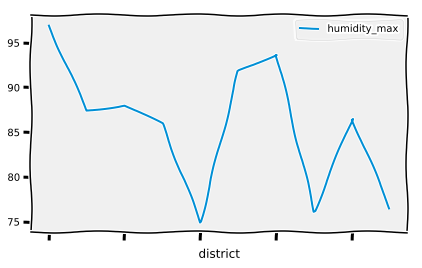

In [28]:
#maximum humidity sangareddy
sort1.head(10).plot(x = 'district',y='humidity_max' )

In [29]:
#datewise area with highest rainfall
rain_v = df.sort_values('odate')
rain_v.max()

Aws ID                     20014
district         Yadadri-Bhongir
mandal                 Zahirabad
location              Zahirabad 
odate                   31/08/18
cumm_rainfall              303.8
humidity_min                99.9
humidity_max                 100
dtype: object

In [30]:
dist=df.groupby('district')
dist.describe()


Aws ID                ...  humidity_min      
                            count          mean  ...           75%   max
district                                         ...                    
Adilabad                   5225.0  10871.105263  ...        59.700  99.7
Bhadradri-Kothagudem       7150.0  10903.923077  ...        63.300  99.9
Hyderabad                  4675.0  11026.647059  ...        51.100  99.2
Jagtial                    7975.0  11082.103448  ...        62.700  99.9
Jangaon                    5500.0  11441.000000  ...        54.000  99.8
Jayashankar-Bhupalpally    7975.0  11082.103448  ...        61.500  99.9
Jogulamba-Gadwal           5225.0  11944.526316  ...        48.000  94.9
Kamareddy                  7975.0  11368.482759  ...        58.750  99.8
Karimnagar                 6875.0  11158.760000  ...        59.200  99.9
Khammam                   10450.0  11170.552632  ...        56.500  99.9
Kumuram Bheem - Asifabad   4950.0  10990.055556  ...        58.300  99.8
Mahabubabad                5775.0  10982.666667  ...        55.900  99.7
Mahabubnagar              11275.0  10989.634146  ...        53.100  99.1
Mancherial                 6325.0  10866.565217  ...        62.600  99.8
Medak                      9350.0  11300.735294  ...        59.500  99.9
Medchal-Malkajgiri         5500.0  11032.950000  ...        53.300  99.4
Nagarkurnool               9023.0  10994.196498  ...        51.400  99.7
Nalgonda                  15400.0  11015.428571  ...        52.100  98.5
Nirmal                     7150.0  10960.615385  ...        59.475  99.4
Nizamabad                 10725.0  11665.128205  ...        58.500  99.1
Peddapalli                 5225.0  11228.315789  ...        59.200  99.7
Rajanna-Siricilla          5775.0  11182.238095  ...        56.400  99.5
Rangareddy                13750.0  11153.220000  ...        54.100  99.8
Sangareddy                 9075.0  12123.727273  ...        54.200  99.4
Siddipet                   9625.0  11086.685714  ...        57.200  99.8
Suryapet                   9075.0  11546.090909  ...        54.900  99.9
Vikarabad                  7975.0  11160.103448  ...        54.900  99.8
Wanaparthy                 4675.0  11505.235294  ...        52.000  97.5
Warangal (R)               5775.0  10944.428571  ...        55.750  99.1
Warangal (U)               4400.0  11147.125000  ...        56.400  99.5
Yadadri-Bhongir            7425.0  10953.703704  ...        54.100  98.9

[31 rows x 32 columns]

In [31]:
#district wise all max rainfall,humidity
dist.max().iplot()

In [32]:
#district wise maximum humidity graph
dist['humidity_max'].count().iplot('bar')

In [33]:
#district wise minimum humidity graph
dist['humidity_min'].count().iplot('bar')

In [34]:
#district wise cumm_rainfall graph
dist['cumm_rainfall'].count().iplot('bar')

In [35]:
df[['humidity_max']].iplot(
    kind='scatter',
    histnorm='percent',
    barmode='overlay',
    xTitle='cumm_rainfall',
    yTitle='odate',
    title='datewise rainfall')

In [36]:
first1=df[1:1000]

In [37]:
first1['district'].max()

'Rangareddy'

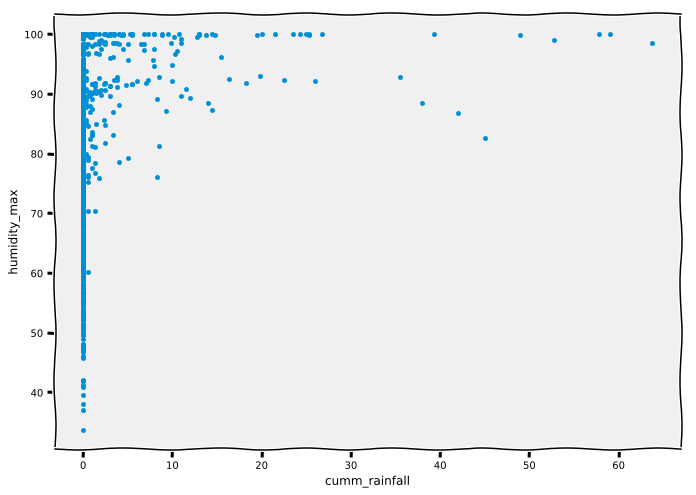

In [38]:
#a plotting between cumm_rainfall,humidity_max 
first1.plot.scatter(x='cumm_rainfall', y='humidity_max', figsize=(10,8))

In [39]:
dstrct=df.groupby('district')

In [40]:
dstrct.count()

,Aws ID,mandal,location,odate,cumm_rainfall,humidity_min,humidity_max
district,,,,,,,
Adilabad,5225,5225,5225,5225,5225,5224,5224
Bhadradri-Kothagudem,7150,7150,7150,7150,7150,7148,7146
Hyderabad,4675,4675,4675,4675,4675,4675,4675
Jagtial,7975,7975,7975,7975,7975,7973,7973
Jangaon,5500,5500,5500,5500,5500,5500,5500
Jayashankar-Bhupalpally,7975,7975,7975,7975,7975,7965,7965
Jogulamba-Gadwal,5225,5225,5225,5225,5225,5225,5225
Kamareddy,7975,7975,7975,7975,7975,7975,7975
Karimnagar,6875,6875,6875,6875,6875,6875,6875


In [41]:
 #Yadadri-Bhongir district
yddrb=df[df['district']=='Yadadri-Bhongir 	']
#cummulative rainfall in Yadadri-Bhongir 	district
yddrb['cumm_rainfall'].iplot(kind='histogram')

In [42]:
#Warangal (U) district
wrgl=df[df['district']=='Warangal (U)']
#cummulative rainfall in Warangal (U)district
wrgl['cumm_rainfall'].iplot(kind='histogram')

In [43]:
#Warangal (R) district
wrgl=df[df['district']=='Warangal (R)']
#cummulative rainfall in Warangal (R) district
wrgl['cumm_rainfall'].iplot(kind='histogram')

In [44]:
#Wanaparthy district
wrgl=df[df['district']=='Wanaparthy']
#cummulative rainfall in Wanaparthy district
wrgl['cumm_rainfall'].iplot(kind='histogram')

In [45]:
#Karimnagar district
krngr=df[df['district']=='Karimnagar']
#cummulative rainfall in Karimnagar district
krngr['cumm_rainfall'].iplot(kind='histogram')

In [46]:
#Karimnagar district
krngr=df[df['district']=='Karimnagar']
#cummulative rainfall in Karimnagar district
krngr['cumm_rainfall'].iplot(kind='histogram')

In [47]:
district=df.groupby('district')

In [48]:
district['humidity_min'].max().iplot()

In [49]:
district['humidity_max'].max().iplot()

In [50]:
 district['cumm_rainfall'].max().iplot()

In [51]:
 hyd=df[df['district']=='Hyderabad']

In [52]:
hyd

,Aws ID,district,mandal,location,odate,cumm_rainfall,humidity_min,humidity_max
550,10006,Hyderabad,Shaikpet,Jubileehills,01/01/18,0.0,40.6,85.0
551,10006,Hyderabad,Shaikpet,Jubileehills,02/01/18,0.0,37.5,74.9
552,10006,Hyderabad,Shaikpet,Jubileehills,03/01/18,0.0,43.8,86.4
553,10006,Hyderabad,Shaikpet,Jubileehills,04/01/18,0.0,41.6,80.9
554,10006,Hyderabad,Shaikpet,Jubileehills,05/01/18,0.0,42.9,71.2
555,10006,Hyderabad,Shaikpet,Jubileehills,06/01/18,0.0,37.5,76.8
556,10006,Hyderabad,Shaikpet,Jubileehills,07/01/18,0.0,35.5,74.4
557,10006,Hyderabad,Shaikpet,Jubileehills,08/01/18,0.0,40.9,74.6
558,10006,Hyderabad,Shaikpet,Jubileehills,09/01/18,0.0,42.7,81.6
559,10006,Hyderabad,Shaikpet,Jubileehills,10/01/18,0.0,51.2,77.8


In [53]:
 hyd.describe()

,Aws ID,cumm_rainfall,humidity_min,humidity_max
count,4675.000000,4675.000000,4675.000000,4675.000000
mean,11026.647059,1.752535,39.357711,75.253326
std,551.054076,6.246835,17.971576,14.977512
min,10006.000000,0.000000,6.600000,30.500000
25%,10924.000000,0.000000,25.300000,64.500000
50%,11194.000000,0.000000,35.600000,75.400000
75%,11198.000000,0.000000,51.100000,87.600000
max,12542.000000,93.800000,99.200000,100.000000


In [54]:
hyd['mandal'].unique()

array(['Shaikpet', 'Musheerabad', 'Bandlaguda', 'Ameerpet', 'Saidabad',
       'Tirumalagiri', 'Marredpally', 'Secunderabad', 'Himayatnagar',
       'Khairatabad', 'Asifnagar', 'Amberpet', 'Bahadurpura', 'Golkonda',
       'Nampally', 'Charminar'], dtype=object)

In [55]:
district['mandal'].count().iplot('bar')

In [56]:
 dstrct.count()

,Aws ID,mandal,location,odate,cumm_rainfall,humidity_min,humidity_max
district,,,,,,,
Adilabad,5225,5225,5225,5225,5225,5224,5224
Bhadradri-Kothagudem,7150,7150,7150,7150,7150,7148,7146
Hyderabad,4675,4675,4675,4675,4675,4675,4675
Jagtial,7975,7975,7975,7975,7975,7973,7973
Jangaon,5500,5500,5500,5500,5500,5500,5500
Jayashankar-Bhupalpally,7975,7975,7975,7975,7975,7965,7965
Jogulamba-Gadwal,5225,5225,5225,5225,5225,5225,5225
Kamareddy,7975,7975,7975,7975,7975,7975,7975
Karimnagar,6875,6875,6875,6875,6875,6875,6875


In [57]:
#adilabad
adb=df[df['district']=='Adilabad']

In [58]:
 #cummulative rainfall in adilabad
adb['cumm_rainfall'].iplot(kind='histogram')

In [59]:
#bhadradri-kothagudem
bdrd=df[df['district']=='Bhadradri-Kothagudem']

In [60]:
 #cummulative rainfall in bhadradri-kothagudem
bdrd['cumm_rainfall'].iplot(kind='histogram')

In [61]:
#hyderabad
hyd=df[df['district']=='Hyderabad']

In [62]:
 #cummulative rainfall in hyderabad
hyd['cumm_rainfall'].iplot(kind='histogram')

In [63]:
 #jagtial
jgtl=df[df['district']=='Jagtial']

In [64]:
 #cummulative rainfall in jagtial
jgtl['cumm_rainfall'].iplot(kind='histogram')

In [65]:
 #jangaon district
jngn=df[df['district']=='Jangaon']

In [66]:
 #cummulative rainfall in jangaon district
jngn['cumm_rainfall'].iplot(kind='histogram')

In [67]:
#Jayashankar-Bhupalpally district
asnkr=df[df['district']=='ayashankar-Bhupalpally']

In [68]:
#cummulative rainfall in ayashankar-Bhupalpally  district
asnkr['cumm_rainfall'].iplot(kind='histogram')

In [69]:
#Jogulamba-Gadwal district
jglmba=df[df['district']=='Jogulamba-Gadwal']
#cummulative rainfall in Jogulamba-Gadwal district
jglmba['cumm_rainfall'].iplot(kind='histogram')

In [70]:
#Kamareddy district
kmrdy=df[df['district']=='Kamareddy']
#cummulative rainfall in Kamareddy district
kmrdy['cumm_rainfall'].iplot(kind='histogram')

In [71]:
#Karimnagar district
krmngr=df[df['district']=='Karimnagar']
#cummulative rainfall in Karimnagar district
krmngr['cumm_rainfall'].iplot(kind='histogram')

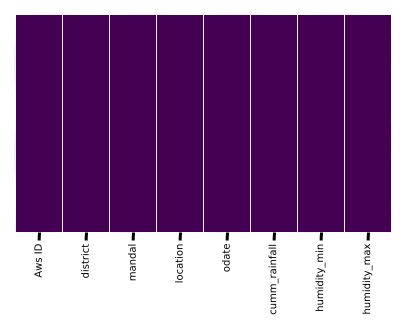

In [72]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

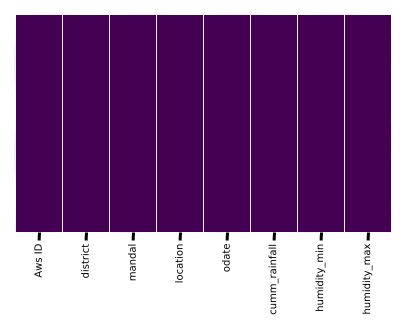

In [73]:
df.dropna(how='any', inplace=True)
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [74]:
subdivs = df['Aws ID'].unique()
num_of_subdivs = subdivs.size
print('Total # of Subdivs: ' + str(num_of_subdivs))
subdivs

Total # of Subdivs: 863


array([10001, 10005, 10006, 10008, 10009, 10010, 10011, 10012, 10013,
       10014, 10016, 10017, 10018, 10019, 10020, 10021, 10022, 10023,
       10024, 10025, 10026, 10027, 10029, 10030, 10032, 10033, 10037,
       10040, 10042, 10054, 10057, 10059, 10060, 10068, 10070, 10076,
       10081, 10082, 10086, 10093, 10097, 10100, 10130, 10131, 10133,
       10135, 10137, 10138, 10139, 10140, 10142, 10144, 10145, 10147,
       10148, 10149, 10151, 10152, 10153, 10154, 10155, 10157, 10158,
       10160, 10161, 10162, 10164, 10165, 10166, 10167, 10168, 10169,
       10171, 10173, 10174, 10175, 10178, 10183, 10184, 10188, 10194,
       10195, 10198, 10199, 10200, 10202, 10205, 10207, 10209, 10213,
       10214, 10217, 10218, 10220, 10222, 10224, 10226, 10229, 10235,
       10236, 10238, 10240, 10243, 10245, 10248, 10249, 10252, 10255,
       10257, 10264, 10266, 10272, 10280, 10283, 10284, 10287, 10290,
       10293, 10295, 10296, 10297, 10298, 10299, 10300, 10302, 10303,
       10305, 10306,

In [75]:
subdivs = df['district'].unique()
num_of_subdivs = subdivs.size
print('Total # of Subdivs: ' + str(num_of_subdivs))
subdivs

Total # of Subdivs: 31


array(['Medchal-Malkajgiri', 'Rangareddy', 'Hyderabad', 'Vikarabad',
       'Mahabubnagar', 'Wanaparthy', 'Jogulamba-Gadwal', 'Nagarkurnool',
       'Yadadri-Bhongir', 'Nalgonda', 'Suryapet', 'Siddipet', 'Jangaon',
       'Mancherial', 'Warangal (U)', 'Nirmal', 'Jayashankar-Bhupalpally',
       'Sangareddy', 'Kamareddy', 'Adilabad', 'Warangal (R)',
       'Mahabubabad', 'Nizamabad', 'Medak', 'Bhadradri-Kothagudem',
       'Jagtial', 'Khammam', 'Peddapalli', 'Karimnagar',
       'Rajanna-Siricilla', 'Kumuram Bheem - Asifabad'], dtype=object)

district
Adilabad                    4.568492
Peddapalli                  4.365850
Kumuram Bheem - Asifabad    4.128078
Name: cumm_rainfall, dtype: float64
district
Nagarkurnool        1.379741
Wanaparthy          1.311123
Jogulamba-Gadwal    1.222411
Name: cumm_rainfall, dtype: float64


/opt/conda/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning:

findfont: Font family ['xkcd', 'xkcd Script', 'Humor Sans', 'Comic Sans MS'] not found. Falling back to DejaVu Sans.



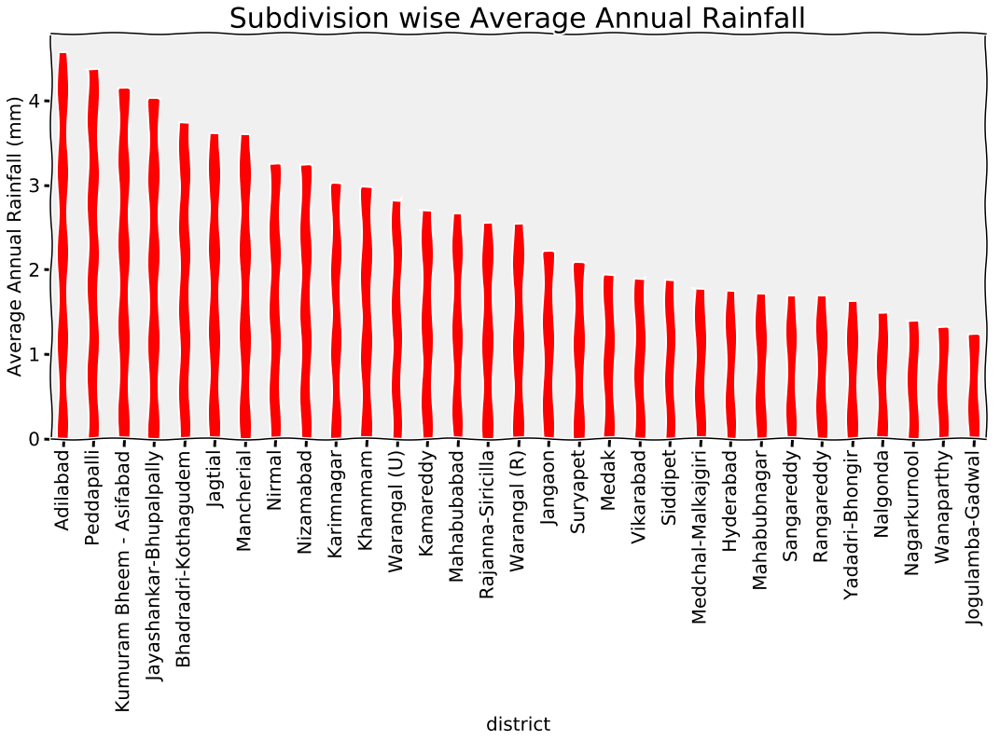

In [76]:
fig = plt.figure(figsize=(16,8))
ax = fig.add_subplot(111)
df.groupby('district').mean().sort_values(by='cumm_rainfall', ascending=False)['cumm_rainfall'].plot('bar', color='r',width=0.3,title='Subdivision wise Average Annual Rainfall', fontsize=20)
plt.xticks(rotation = 90)
plt.ylabel('Average Annual Rainfall (mm)')
ax.title.set_fontsize(30)
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)
print(df.groupby('district').mean().sort_values(by='cumm_rainfall', ascending=False)['cumm_rainfall'][[0,1,2]])
print(df.groupby('district').mean().sort_values(by='cumm_rainfall', ascending=False)['cumm_rainfall'][[28,29,30]])

Max: 34585.79999999943 ocurred in ['Nizamabad']
Max: 6129.500000000052 ocurred in ['Wanaparthy']
Mean: 18806.551612902946


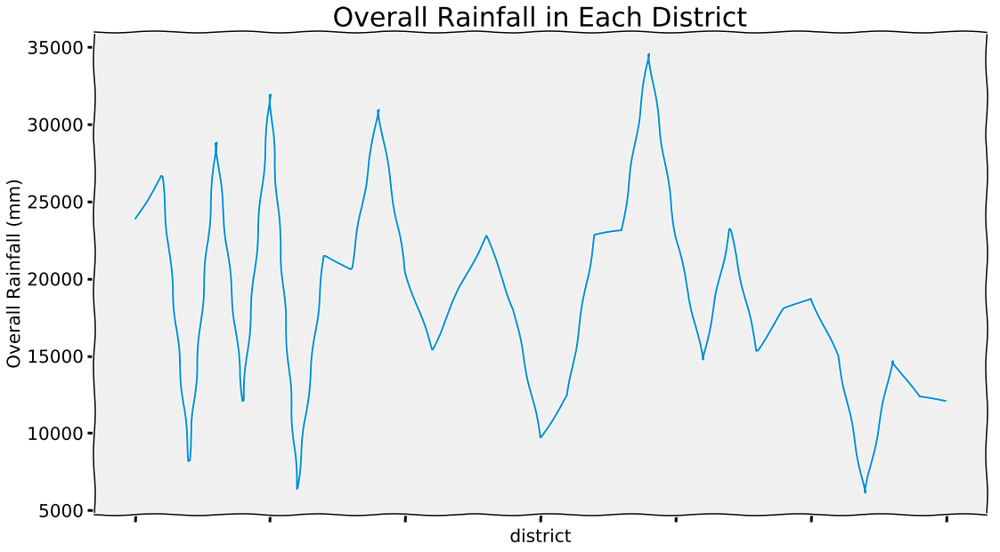

In [77]:
fig = plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
dfg = df.groupby('district').sum()['cumm_rainfall']
dfg.plot('line', title='Overall Rainfall in Each District', fontsize=20)

plt.ylabel('Overall Rainfall (mm)')
ax.title.set_fontsize(30)
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)
print('Max: ' + str(dfg.max()) + ' ocurred in ' + str(dfg.loc[dfg == dfg.max()].index.values[0:]))
print('Max: ' + str(dfg.min()) + ' ocurred in ' + str(dfg.loc[dfg == dfg.min()].index.values[0:]))
print('Mean: ' + str(dfg.mean()))

Max: 11189.604285309153 ocurred in ['Aws ID']
Max: 2.5583762359348987 ocurred in ['cumm_rainfall']
Mean: 2828.6337437707643


/opt/conda/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning:

findfont: Font family ['xkcd', 'xkcd Script', 'Humor Sans', 'Comic Sans MS'] not found. Falling back to DejaVu Sans.



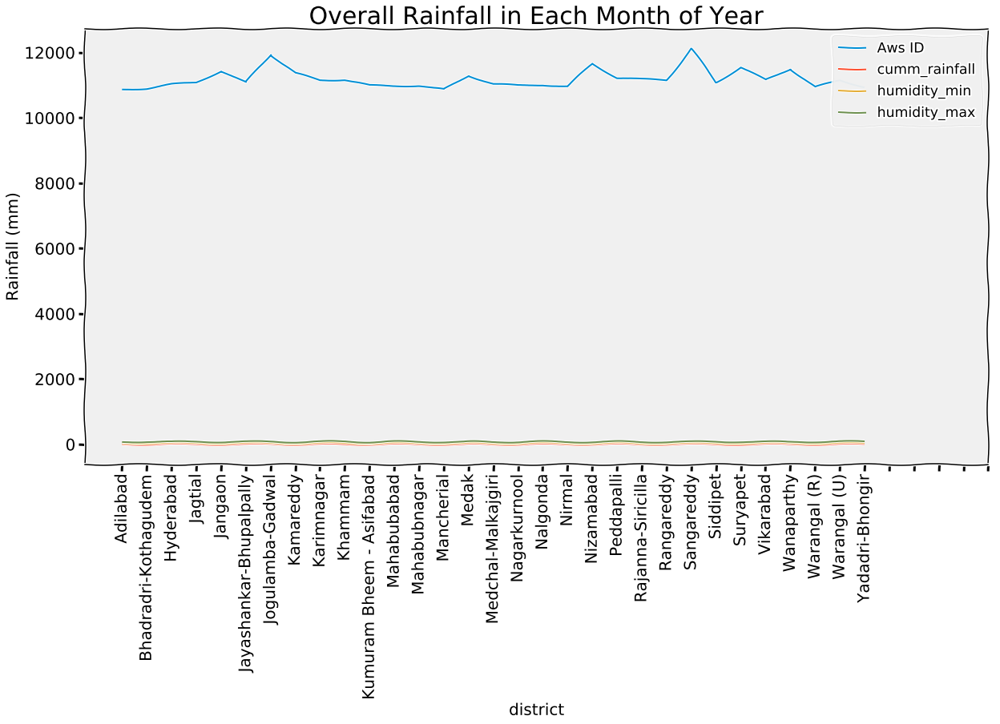

In [78]:
months = df.columns[2:14]
fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(111)
xlbls = df['district'].unique()
xlbls.sort()
dfg = df.groupby('district').mean()
dfg.plot.line(title='Overall Rainfall in Each Month of Year', ax=ax,fontsize=20)
plt.xticks(np.linspace(0,35,36,endpoint=True),xlbls)
plt.xticks(  rotation = 90)
plt.ylabel('Rainfall (mm)')
plt.legend(loc='upper right', fontsize = 'xx-large')
ax.title.set_fontsize(30)
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)

dfg = dfg.mean(axis=0)
print('Max: ' + str(dfg.max()) + ' ocurred in ' + str(dfg.loc[dfg == dfg.max()].index.values[0:]))
print('Max: ' + str(dfg.min()) + ' ocurred in ' + str(dfg.loc[dfg == dfg.min()].index.values[0:]))
print('Mean: ' + str(dfg.mean()))

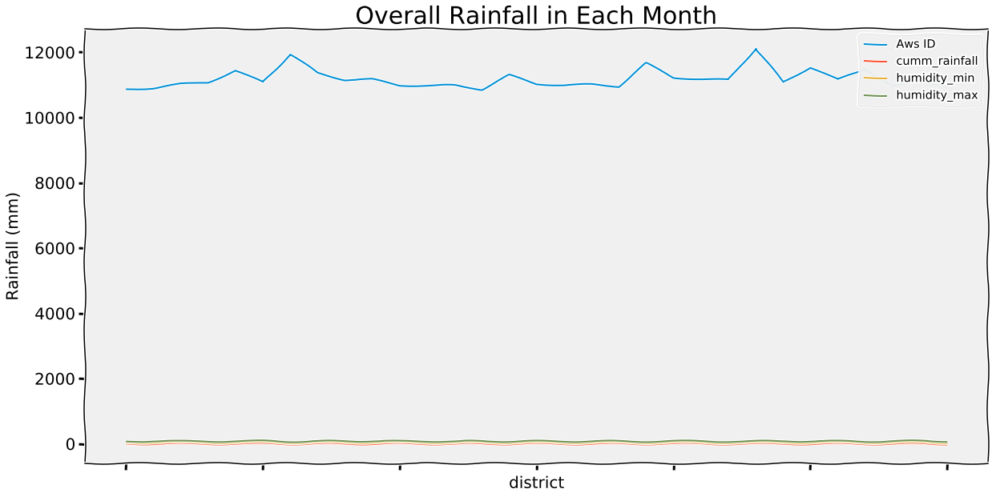

In [79]:

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(111)
df.groupby('district').mean().plot.line(title='Overall Rainfall in Each Month', ax=ax,fontsize=20)
#plt.xticks(np.linspace(0,35,36,endpoint=True),xlbls)
plt.xticks(  rotation = 90)
plt.ylabel('Rainfall (mm)')
plt.legend(loc='upper right', fontsize = 'x-large')
ax.title.set_fontsize(30)
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)

Max: 11189.604285309153 ocurred in ['Aws ID']
Max: 2.5583762359348987 ocurred in ['cumm_rainfall']
Mean: 2828.6337437707643


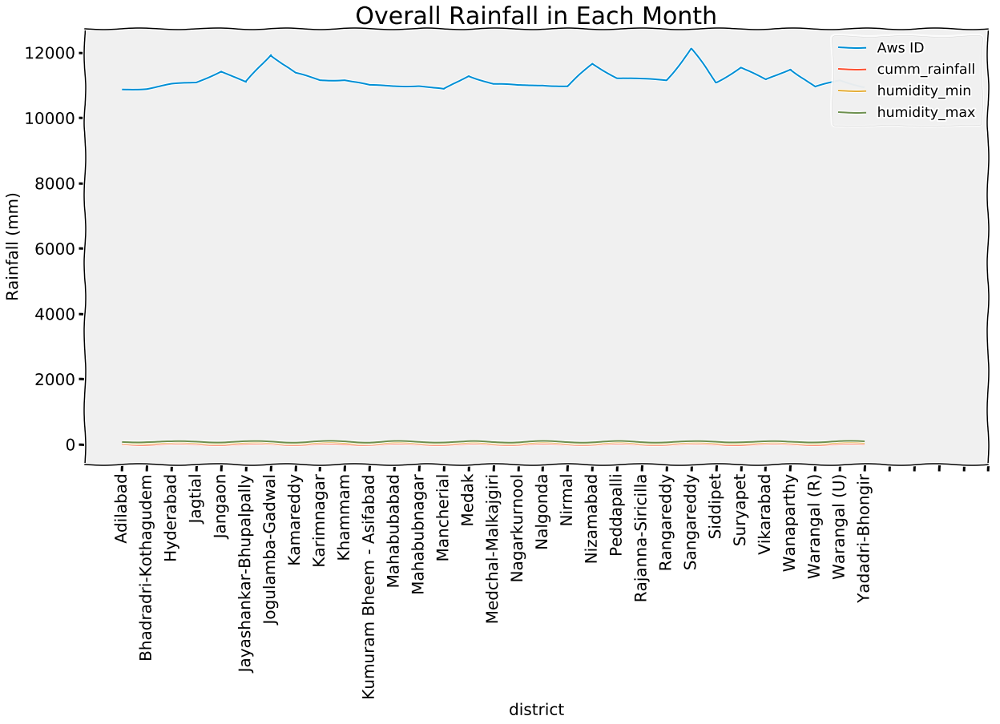

In [80]:
fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(111)
xlbls = df['district'].unique()
xlbls.sort()
dfg = df.groupby('district').mean()
dfg.plot.line(title='Overall Rainfall in Each Month', ax=ax,fontsize=20)
plt.xticks(np.linspace(0,35,36,endpoint=True),xlbls)
plt.xticks(  rotation = 90)
plt.ylabel('Rainfall (mm)')
plt.legend(loc='upper right', fontsize = 'xx-large')
ax.title.set_fontsize(30)
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)

dfg = dfg.mean(axis=0)
print('Max: ' + str(dfg.max()) + ' ocurred in ' + str(dfg.loc[dfg == dfg.max()].index.values[0:]))
print('Max: ' + str(dfg.min()) + ' ocurred in ' + str(dfg.loc[dfg == dfg.min()].index.values[0:]))
print('Mean: ' + str(dfg.mean()))

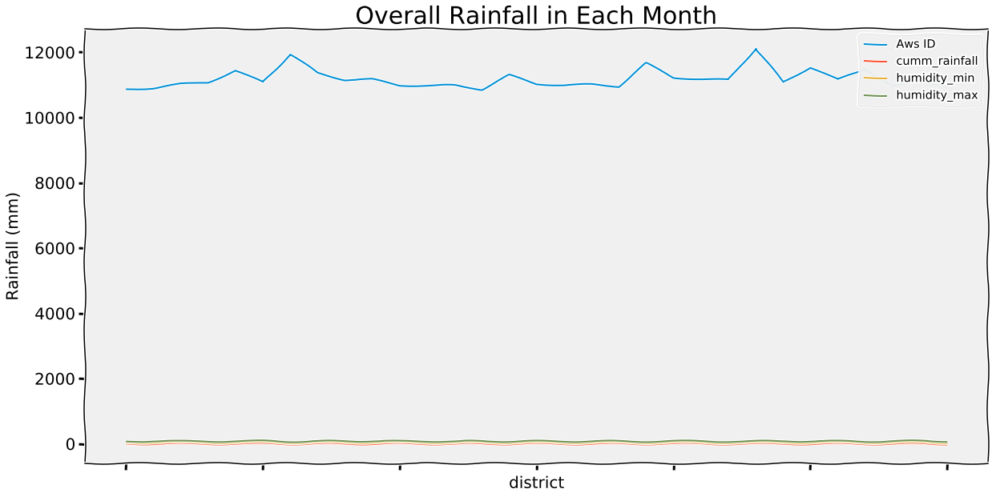

In [81]:
fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(111)
df.groupby('district').mean().plot.line(title='Overall Rainfall in Each Month', ax=ax,fontsize=20)
#plt.xticks(np.linspace(0,35,36,endpoint=True),xlbls)
plt.xticks(  rotation = 90)
plt.ylabel('Rainfall (mm)')
plt.legend(loc='upper right', fontsize = 'x-large')
ax.title.set_fontsize(30)
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)

MAD (Training Data): 3.8581830297519466
MAD (Test Data): 3.8706197860115297


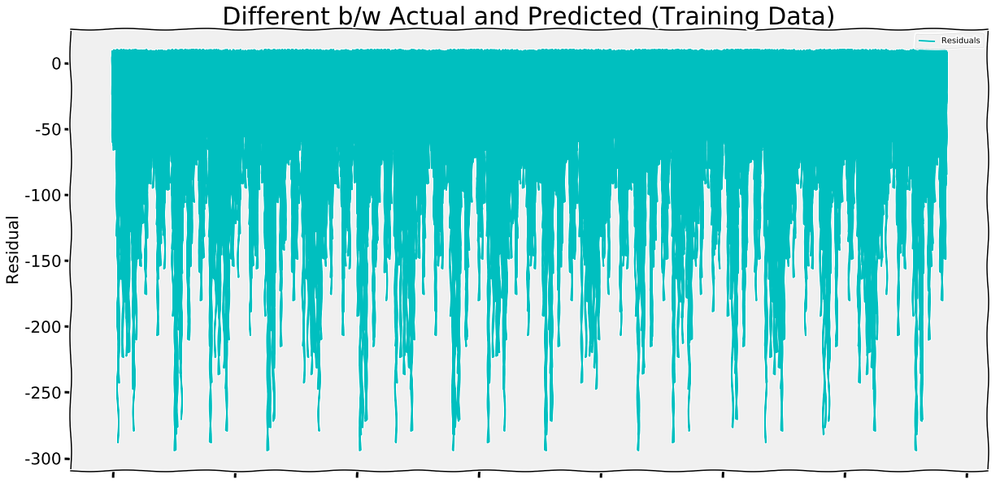

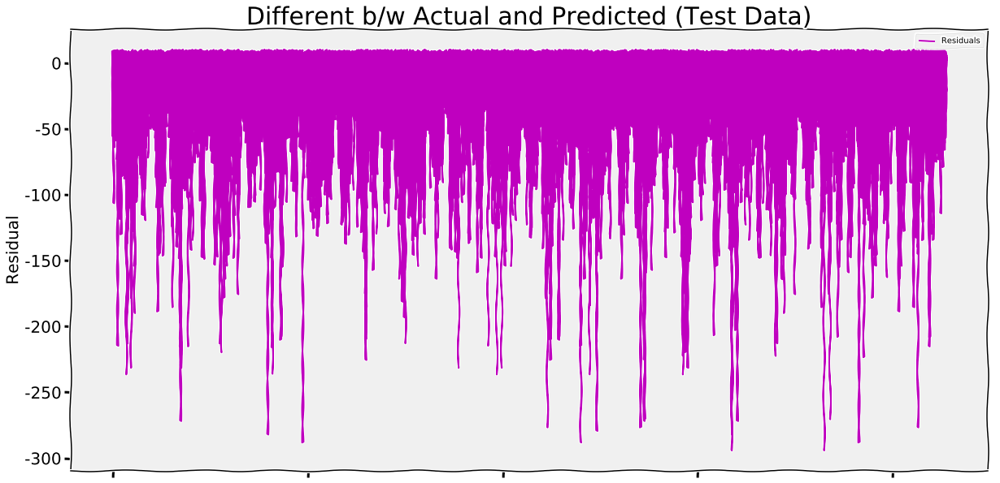

In [82]:
import sklearn.linear_model as sk
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import metrics

df2 = df[['Aws ID','cumm_rainfall','humidity_min','humidity_max']]
df2.columns = np.array(['Aws ID', 'x1','x2','x3'])

for k in range(1,9):
    df3 = df[['Aws ID','cumm_rainfall','humidity_min','humidity_max']]
    df3.columns = np.array(['Aws ID', 'x1','x2','x3'])
    df2 = df2.append(df3)
df2.index = range(df2.shape[0])
    
#df2 = pd.concat([df2, pd.get_dummies(df2['SUBDIVISION'])], axis=1)

df2.drop('Aws ID', axis=1,inplace=True)
#print(df2.info())
msk = np.random.rand(len(df2)) < 0.8

df_train = df2[msk]
df_test = df2[~msk]
df_train.index = range(df_train.shape[0])
df_test.index = range(df_test.shape[0])

reg =sk.LinearRegression()
reg.fit(df_train.drop('x1',axis=1),df_train['x1'])
predicted_values = reg.predict(df_train.drop('x1',axis=1))
residuals = predicted_values-df_train['x1'].values
print('MAD (Training Data): ' + str(np.mean(np.abs(residuals))))
df_res = pd.DataFrame(residuals)
df_res.columns = ['Residuals']

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(111)
df_res.plot.line(title='Different b/w Actual and Predicted (Training Data)', color = 'c', ax=ax,fontsize=20)
ax.xaxis.set_ticklabels([])
plt.ylabel('Residual')
ax.title.set_fontsize(30)
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)


predicted_values = reg.predict(df_test.drop('x1',axis=1))
residuals = predicted_values-df_test['x1'].values
print('MAD (Test Data): ' + str(np.mean(np.abs(residuals))))
df_res = pd.DataFrame(residuals)
df_res.columns = ['Residuals']

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(111)
df_res.plot.line(title='Different b/w Actual and Predicted (Test Data)', color='m', ax=ax,fontsize=20)
ax.xaxis.set_ticklabels([])
plt.ylabel('Residual')
ax.title.set_fontsize(30)
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe520a2a048>,
      dtype=object)

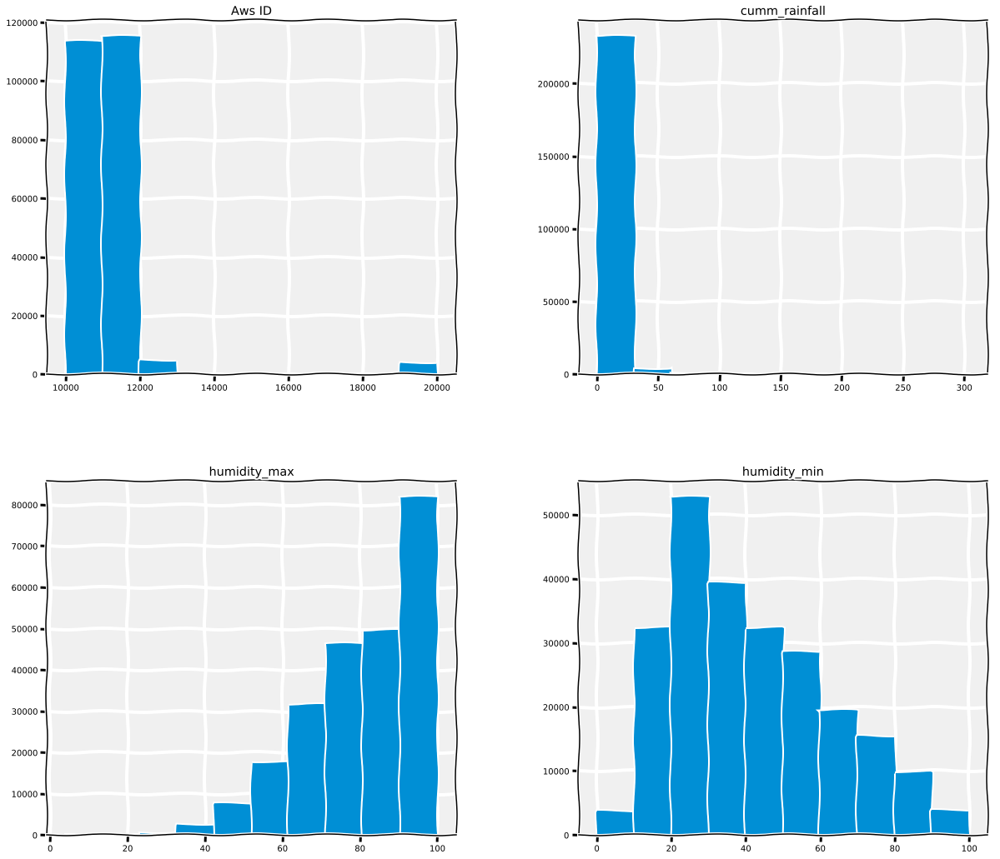

In [83]:
df.hist(figsize=(18,18))

In [84]:
# Graph has date on the x-axis
p = figure(title="Graph 1:Rainfall per day in 2018", x_axis_type='datetime')

p.line(x='odate', y='Count') #build a line chart
p.xaxis.axis_label = 'odate'
p.yaxis.axis_label = 'humidity_min'

p.xgrid.grid_line_color = None

# add a hover tool and show the date in date time format
hover = HoverTool()
hover.tooltips=[
    ('odate', '@Date{%F}'),
    ('Count', '@Count')
]
hover.formatters = {'odate': 'datetime'}
p.add_tools(hover)
output_notebook() # show the output in jupyter notebook
show(p)

Loading BokehJS ...

In [85]:
# Distribution graphs (histogram/bar graph) of column data
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()

In [86]:
# Correlation matrix
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()


In [87]:
# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()


In [88]:
nRowsRead = 1000 # specify 'None' if want to read whole file
# scmp2k19.csv has 237273 rows in reality, but we are only loading/previewing the first 1000 rows
df1 = pd.read_csv('../input/scmp2k19.csv', delimiter=',', nrows = nRowsRead)
df1.dataframeName = 'scmp2k19.csv'
nRow, nCol = df1.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 1000 rows and 8 columns


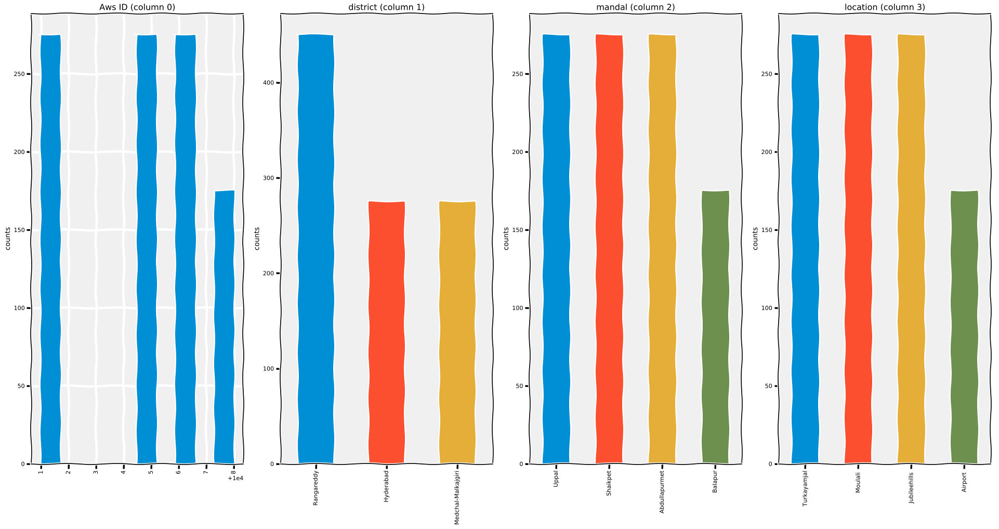

In [89]:
plotPerColumnDistribution(df1, 10, 5)

/opt/conda/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning:

findfont: Font family ['xkcd', 'xkcd Script', 'Humor Sans', 'Comic Sans MS'] not found. Falling back to DejaVu Sans.



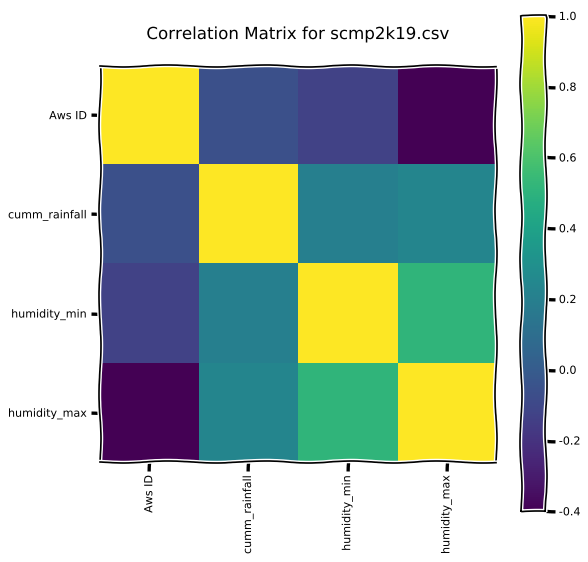

In [90]:
plotCorrelationMatrix(df1, 8)

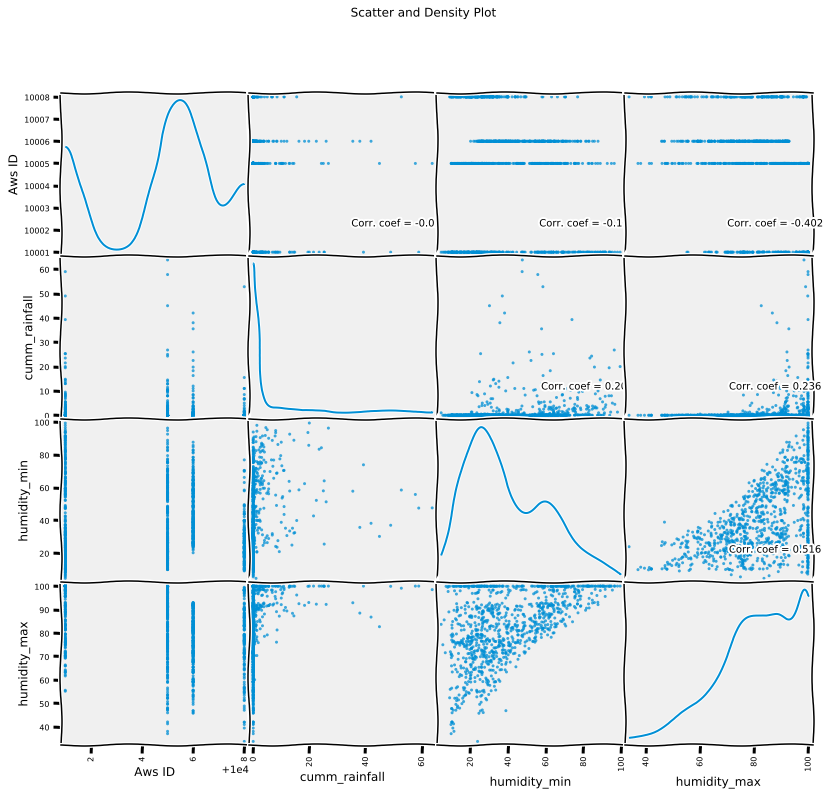

In [91]:
plotScatterMatrix(df1, 12, 10)